<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Jane Slagle
    Math 321 Section 2
    12/2/21

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
import numpy as np
from scipy.io import wavfile
import IPython
from scipy.fftpack import fft, ifft
from scipy import signal
from scipy.fftpack import fft2, ifft2
import imageio

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        #store each input as an attribute
        self.rate = rate
        self.samples = samples
        
        
    # Problems 1.1 and 1.7
    def plot(self, the_bool = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        seconds = len(self.samples) / self.rate         #use equation 1.1 in lab manual to label x-axis
        
        #problem 7 stuff:
        if the_bool == True:
            dft = fft(self.samples)                 #get the dft using scipy's dft
            mags = np.abs(dft[:len(dft)//2])        #get the magnitude: told in lab manual to take abs value
                                                    #only want the 1st 1/2 so take up to the first half of dft
            #use equation 1.7 in lab manual to get frequencies: k is the index: so use list comprehension to get
            freq = [k * self.rate / len(self.samples) for k in range(len(dft)//2)]
            
            plt.plot(freq, mags, color = "navy")
            plt.xlabel("Frequencies (Hz)")
            plt.ylabel("Magnitudes")
            
        else:
            x = np.linspace(0, seconds, len(self.samples))  #need linspace to actually plot samples over
            plt.axis([0, seconds, -32768, 32767])           #need to set the limits for x, y

            plt.plot(x, samples, color = "mediumvioletred")    #now plot the sound wave
            plt.title("Sound Wave (time vs amplitude)")
            plt.xlabel("Time in seconds")
            plt.ylabel("Samples")

        plt.show()

    
    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        #scale it before write to the file
        if (type(self.samples[0]) != np.int16):
            scaled_samples = np.int16((self.samples / np.max(np.abs(self.samples))) * 32767)
            
            wavfile.write(filename, self.rate, scaled_samples) #write to specified file w/ scaled samples bc
                                                               #will want samples to be scaled if in this loop
        elif force == True:
            scaled_samples = np.int16((self.samples / np.max(np.abs(self.samples))) * 32767)
            wavfile.write(filename, self.rate, scaled_samples) 
            
        else:
            wavfile.write(filename, self.rate, self.samples)
                
                
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        #A and B are self.samples and other.samples
        #raise value error if 2 sample arrays are not same length
        if len(self.samples) != len(other.samples):
            raise ValueError("The 2 sample arrays are not the same length")
        
        #magic method so dont need if statements or anything, etc.
        new_samp = self.samples + other.samples
        new = SoundWave(self.rate, new_samp)
        
        return new
        

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #raise value error if 2 sample rates not equal:
        if self.rate != other.rate:
            raise ValueError("The 2 sample rates are not equal")
        
        new_sample = np.concatenate((self.samples, other.samples))
        new = SoundWave(self.rate, new_sample)
        
        return new
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #If the samples from A and B are not the same
        #length, append zeros to the shorter array to make them the same length b efore convolving
        
        if self.rate != other.rate:
            raise ValueError("The 2 sample rates are not equal")  #raise ValueError if 2 sample rates not equal
        
        while len(self.samples) < len(other.samples):  
            self.samples = np.append(self.samples, 0)   #add 0s while they aren't the same length and the while loop condition
                                     #makes it so that you add 0s until they are the same length
                                     #the format of this says: add 0s to self.samples (since numpy array)
        
        while len(other.samples) < len(self.samples):
            other.samples = np.append(other.samples, 0)
            
        #use scipy.fftpack and equation 7.4 from lab manaul to compute the convolution
        #in equation 7.4: the Fn thing is the scipy.fftpack stuff: the inverse one will be ifft, the noninverse
        #one will be fft (this is bc the Fn thing is the DFT)
        #Fn*f is the fft here. f is self.samples, g is other.samples
        convolution = ifft(np.multiply(fft(self.samples), fft(other.samples))).real
        
        return SoundWave(self.rate, convolution)
        
        
    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("The 2 sample rates are not equal")  #raise valueError if 2 rates aren't same
        
        #define what m and n are
        n = len(self.samples)
        m = len(other.samples)
        
        a = 0  #initialize a
        while 2**a < m+n-1:
            a += 1
        
        #Append zeros to each sample so that they each have 2^a entries
        self_zeros = np.zeros(2**a - n)   #the zeros to add to self one
        other_zeros = np.zeros(2**a - m)  #the zeros to add to other one
        
        #add the zeros to each one now
        A_samples = np.concatenate((self.samples, self_zeros))
        B_samples = np.concatenate((other.samples, other_zeros))
    
        #compute convolution of these padded samples using equation 7.4 in lab manual
        convolution = ifft(np.multiply(fft(A_samples), fft(B_samples))).real
        
        #get the 1st n+m-1 entries of convolution
        convolution = convolution[:n+m-1]
        
        return SoundWave(self.rate, convolution)
        
        
    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #given v_low, v_high (the freq), but we need to find k_low and k_high using formula given in lab manual k = vn/r
        #where n is the number of samples and r is the rate
        k_low = low_freq * len(self.samples) // self.rate     #do // so that returns an int and want k's to be ints
        k_high = high_freq * len(self.samples) // self.rate
        
        
        #Compute the DFT of the stored samples
        dft = fft(self.samples)
        
        #Set entries of the signal's DFT from k_low to k_high and from n −k_high to n −k_low to zero:
        for i in range(k_low, k_high):
            dft[i] = 0
        for i in range(len(self.samples) - k_high, len(self.samples) - k_low):
            dft[i] = 0
    
        #take IDFT of this altered array and store it as sample array: means you store it as self.samples
        self.samples = np.real(ifft(dft))   #this function is changing self.samples and cleaning them
        
        


### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

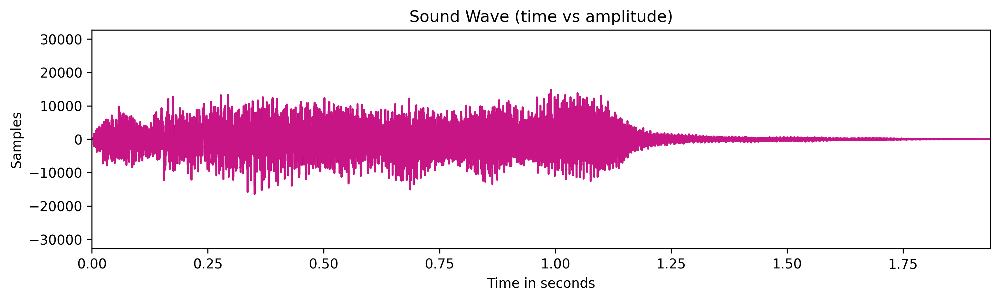

In [4]:
#read tada.wav
rate, samples = wavfile.read("tada.wav")

#create a SoundWave object
sound = SoundWave(rate, samples)

#now plot the wave object
sound.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [5]:
#use export() function to create file with same sound as tada.wav: have force = False 
sound.export("test1.wav", force = False)

#use export() to create file with scaled sound: put force = True in there
sound.export("test2.wav", force = True)

In [6]:
#now display the audio sounds
IPython.display.Audio("tada.wav")

In [7]:
#should sound the same as tada.wav
IPython.display.Audio("test1.wav")

In [8]:
#scaled file should be louder than the other 2
IPython.display.Audio("test2.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [9]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #use lambda thingy to write the function need
    amplitude = lambda x: np.sin(2 * np.pi * x * frequency)  #equation given in lab manual
    X = np.linspace(0, duration, 44100 * duration)  #make linspace from 0 to time and given rate = 44100
    samp_amp = amplitude(X)              #do the amplitude for all of X
    sound_note = SoundWave(rate = 44100, samples = samp_amp)
    
    return sound_note

In [10]:
#use generate_note() function to create tone that is 2 seconds long
generate_note(440, 2).export("generate.wav")  #want for A, told in lab manual table that A is 440
IPython.display.Audio("generate.wav")

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [11]:
#create each of the 3 notes: from the table given in lab manual
A = generate_note(440, 3)  #440 comes from the lab manual. the 3 is because want it to be 3 seconds long
C = generate_note(523.25, 3)
E = generate_note(659.25, 3)

#add the notes together, then export it to new file and play it
chord = A + C + E
(chord).export("prob4.wav")
IPython.display.Audio("prob4.wav")

In [12]:
A = generate_note(440, 1)  #make them all 1 second long because then when add them all together, it will be 3 
C = generate_note(523.25, 1)   #seconds long total
E = generate_note(659.25, 1)

#make the shifts that want
arpeggio = A >> C >> E
(arpeggio).export("tester.wav")
IPython.display.Audio("tester.wav")

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [13]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #copy from page 348 of book to find the DFT. The f here is the samples parameter given
    n = len(samples)
    m = np.arange(n).reshape(n, 1)
    W = np.exp((-2j * np.pi/n) * m @ m.T)
    
    coefficients = W @ samples / n
    
    return coefficients

In [14]:
A = np.random.rand(20)
n = len(A)
me = np.real(n * simple_dft(A))
them = np.real(fft(A))
print(np.allclose(me, them))

True


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [15]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #follow the pseudo code given in lab manual
    f = samples
    N = threshold
    
    def split(g):
        n = len(g)
        
        if n <= N:
            return n * simple_dft(g)   #because simple_dft is fn times g which is what want here
        else:
            even = split(g[::2])
            odd = split(g[1::2])
            z = np.zeros(n).astype(complex)
            
            for k in range(0, n):
                z[k] = np.exp(-2 * np.pi *1j * k / n)
            
            m = n // 2
            
            return np.concatenate([even + np.multiply(z[:m], odd), even + np.multiply(z[m:], odd)])
    return split(f) / len(f)

In [16]:
A = np.random.rand(8192)
n = len(A)
me = n * simple_fft(A)
them = fft(A)
print(np.allclose(me, them))

print(" ")
#print the runtimes of each computation: use %time to do this
print("Computation time for simple_dft:")
%time simple_dft(A)
print(" ")
print("Computation time for simple_fft:")
%time simple_fft(A)
print(" ")
print("Computation time for fft:")
%time fft(A)

True
 
Computation time for simple_dft:
CPU times: user 2.47 s, sys: 222 ms, total: 2.69 s
Wall time: 2.34 s
 
Computation time for simple_fft:
CPU times: user 649 ms, sys: 409 ms, total: 1.06 s
Wall time: 374 ms
 
Computation time for fft:
CPU times: user 541 µs, sys: 177 µs, total: 718 µs
Wall time: 461 µs


array([4090.47614976 -0.j        ,   -5.8423101  -2.35323089j,
         -5.41933765-24.7480821j , ...,   32.1843545  -7.55268129j,
         -5.41933765+24.7480821j ,   -5.8423101  +2.35323089j])

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the MAGNITUDS of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

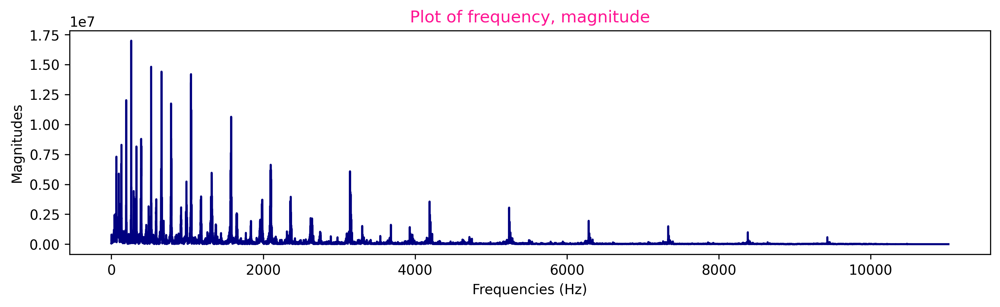

In [17]:
#plot it with the boolean equalling true. use class object made above
plt.title("Plot of frequency, magnitude", color = "deeppink")
sound.plot(the_bool = True)

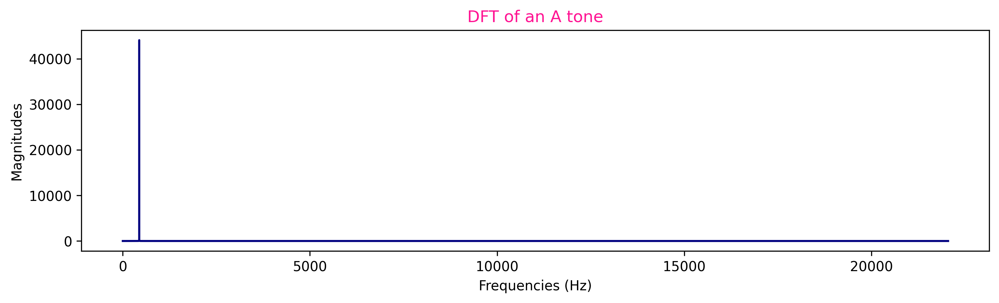

In [18]:
#plot the DFT of an A tone
#problem 3 we made an A tone, so plot that with the_bool as true
plt.title("DFT of an A tone", color = "deeppink")
generate_note(440, 2).plot(the_bool = True)  #generate_note(440, 2) is what we found in prob 3 since that is A tone

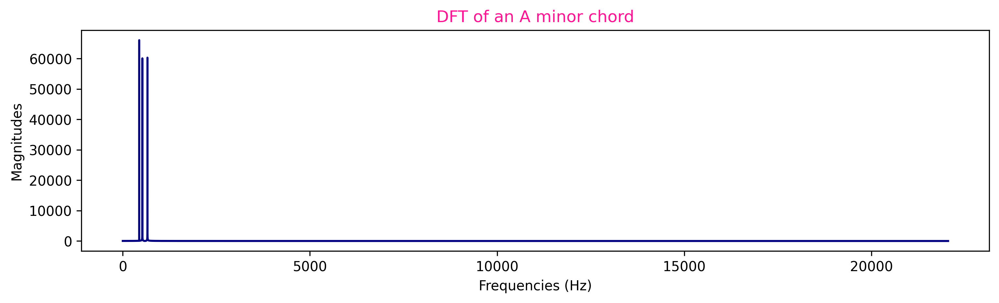

In [19]:
#plot the DFT of A minor tone
plt.title("DFT of an A minor chord", color = "deeppink")
#found A minor chord in prob 4
A = generate_note(440, 3)      #get all of the notes we want the chord for
C = generate_note(523.25, 3)
E = generate_note(659.25, 3)

(A + C + E).plot(the_bool = True)   #get the chord from adding them all together(comes from prob 4)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [20]:
#create a new class object for mystery_chord.wav file now
#read the file
rate2, samples2 = wavfile.read("mystery_chord.wav")

#create a SoundWave object
mystery = SoundWave(rate2, samples2)

In [21]:
#take the DFT of the object
mystery_dft = fft(samples2)
mystery_dft = np.abs(mystery_dft[:len(samples2) // 2])  #only want the 1st half. do abs bc have imaginary components

#want the things that have the highest magnitude (told in lab manaul)
#so do argsort to get indices of the highest magnitude
big_mag = np.argsort(-mystery_dft)[:4]  #do - in front bc argsort gets smallest to largest, but want largest to 
                                        #smallest. And want the 1st 4 because a chord is 3 notes or more and from
                                        #trial and error found that the mystery chord has 4 notes in it

print("The indices of the 3 highest magnitudes:")
print(big_mag)

The indices of the 3 highest magnitudes:
[1760 3136 2093 2350]


In [22]:
#get the frequencies:
freq = [k * rate2 / len(samples2) for k in range(len(samples2)//2)]

In [23]:
#put the indices into the frequency list: because the indices tell us where we have the biggest magnitude is
big_freaks = []  #list to store the biggest frequencies in
for ind in big_mag:
    big_freaks.append(freq[ind])

print("The 3 frequencies with the largest magnitudes are:")
print(big_freaks)

The 3 frequencies with the largest magnitudes are:
[440.0, 784.0, 523.25, 587.5]


In [24]:
#now get the audio for these 4 notes from the table and make sure it sounds the same 
#as the sound in the mystery chord
A = generate_note(440, 4)   #first generate the notes want with the frequencies we have from the file
G = generate_note(783.99, 4)
C = generate_note(523.25, 4)
D = generate_note(587.33, 4)

chord = A + G + C + D             #now get the chord
chord.export("prob8.wav")
IPython.display.Audio("prob8.wav")  

In [25]:
IPython.display.Audio(filename = "mystery_chord.wav")

The notes are... A (with frequency 440.0), G (with frequency 784.0), and C (with frequency 523.25) and D (with frequency 587.5).

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [26]:
#do the white noise part
rate = 22050      #Create 2 seconds of white noise at a given rate.
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)

#need to create a white noise class object
white_noise_wave = SoundWave(rate, white_noise)

#now compute circular convolution of tada.wav and white noise: the object associated with the tada.wav is called
#sound
tada_white = sound * white_noise_wave

#display the circular convolution by itself
tada_white.export("tada_white.wav")
IPython.display.Audio("tada_white.wav")

In [27]:
#display the circular convolution appended to itself

tada_white = tada_white >> tada_white   #told in lab manual to use >> to append the convolution result to itself
tada_white.export("tada_white_conv.wav", force = False)
IPython.display.Audio("tada_white_conv.wav")

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [28]:
#read CGC.wa
rate, samples = wavfile.read("CGC.wav")
cgc_sound = SoundWave(rate, samples)

#read GCG.wav
rate, samples = wavfile.read("GCG.wav")
gcg_sound = SoundWave(rate, samples)

In [29]:
#time our convolution we wrote from prob 2
print("Computation time for problem 2 pow method:")
%time gcg_sound**cgc_sound
print(" ")

#time scipy.signal.fftconvolve method
print(" ")
print("Computation time for scipy.signal.fftconvolve():")
%time signal.fftconvolve(gcg_sound, cgc_sound)

Computation time for problem 2 pow method:
CPU times: user 61.7 ms, sys: 7.17 ms, total: 68.8 ms
Wall time: 66.5 ms
 
 
Computation time for scipy.signal.fftconvolve():
CPU times: user 10.3 ms, sys: 1.54 ms, total: 11.9 ms
Wall time: 11.1 ms


In [30]:
#embed the original sound for CGC
cgc_sound.export("cgc_sound.wav")
IPython.display.Audio("cgc_sound.wav")

In [31]:
#embed the original sound for GCG
gcg_sound.export("gcg_sound.wav")
IPython.display.Audio("gcg_sound.wav")

In [32]:
#find linear convolution using scipy.signal.fftconvolve() method
convol = signal.fftconvolve(cgc_sound, gcg_sound)

#embed the sound of the convolution
convol.export("convol.wav")
IPython.display.Audio("convol.wav")

In [33]:
#embed the convolution sound from method we wrote in prob 2
prob2_conv = gcg_sound**cgc_sound
prob2_conv.export("prob2_conv.wav")
IPython.display.Audio("prob2_conv.wav")

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [34]:
#first read the chopin.wav file
rate, samples = wavfile.read("chopin.wav")
chopin_sound = SoundWave(rate, samples)

#then read the balloon.wav file
rate, samples = wavfile.read("balloon.wav")
balloon_sound = SoundWave(rate, samples)

#embed the original chopin sound
chopin_sound.export("chopin_sound.wav")
IPython.display.Audio("chopin_sound.wav")

In [35]:
#embed the original balloon sound
balloon_sound.export("balloon_sound.wav")
IPython.display.Audio("balloon_sound.wav")

In [36]:
#find linear convolution of chopin.wav
conv = signal.fftconvolve(chopin_sound, balloon_sound)

#embed the sound of the convolution
conv.export("conv.wav")
IPython.display.Audio("conv.wav")

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [37]:
#read noisy1.wav file
rate, samples = wavfile.read("noisy1.wav")
noisy1_sound = SoundWave(rate, samples)

#read noisy2.wav file
rate, samples = wavfile.read("noisy2.wav")
noisy2_sound = SoundWave(rate, samples)

#embed the original noisy1.wav sound
noisy1_sound.export("noisy1_sound.wav")
IPython.display.Audio("noisy1_sound.wav")

In [38]:
#clean noisy1.wav: want frequencies from 1250-2600 Hz
noisy1_sound.clean(1250, 2600)

#embed the cleaned version
noisy1_sound.export("1_cleaned.wav")
IPython.display.Audio("1_cleaned.wav")

In [39]:
#embed the original noisy2.wav sound
noisy2_sound.export("noisy2_sound.wav")
IPython.display.Audio("noisy2_sound.wav")

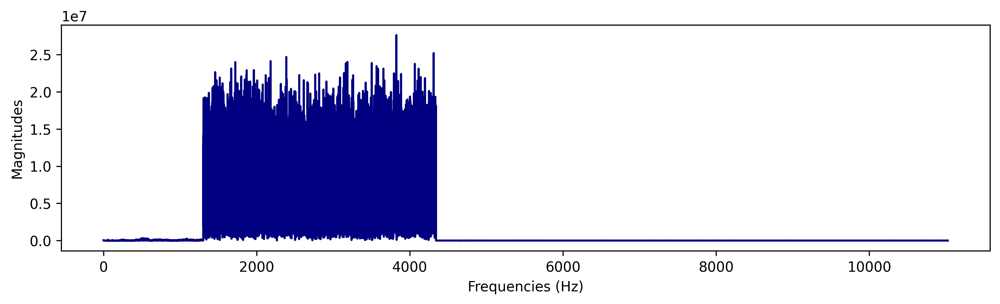

In [40]:
#clean noisy2.wav
#need to plot noisy2.wav so that can figure out which frequencies to use clean over
noisy2_sound.plot(the_bool = True)

#embed the cleaned version
noisy2_sound.clean(1250, 4400)    #got these values from our plot before we cleaned it
noisy2_sound.export("2_cleaned.wav")
IPython.display.Audio("2_cleaned.wav")

###### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [41]:
#first just display the original vuvuzela sound
rate, samples = wavfile.read("vuvuzela.wav")
og_vuvu = SoundWave(rate, samples)
og_vuvu.export("og_vuvu.wav")
IPython.display.Audio("og_vuvu.wav")

In [42]:
#get the 2 channels need
sample1, sample2 = samples.T[0], samples.T[1]  #gets the 2 channels we need. told that the file is like a matrix
                                               #where 1st channel is 1st column, 2nd channel is 2nd column
                                               #take transpose bc originally column vectors, but want them to be 
                                               #row vectors with soundwave stuff
            
vuvu1 = SoundWave(rate, sample1)               #get the channel sounds separately so that can clean them separately
vuvu2 = SoundWave(rate, sample2)

#clean each separately
vuvu1.clean(200, 500)      #told in lab manual that want to clean at 200-500 range
vuvu2.clean(200, 500)

vuvu1.export("vuvu1.wav")
IPython.display.Audio("vuvu1.wav")

In [43]:
vuvu2.export("vuvu2.wav")
IPython.display.Audio("vuvu2.wav")

In [44]:
#recombine the left, right channgels by using concatenate command
new_samp1 = vuvu1.samples    #need to get the cleaned samples from what we just cleaned
new_samp2 = vuvu2.samples

#get the combined sound by combining the cleaned samples
#just need to play the sound, and want the sound of them combined
new_vuvu = np.array([new_samp1, new_samp2]) 

#get the combined sound now
IPython.display.Audio(new_vuvu, rate = rate)  #before would display a wav file which has the rate, so need
                                              #to specify the rate to be able to display it

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

In [45]:
#first read the image
im = imageio.imread("license_plate.png")

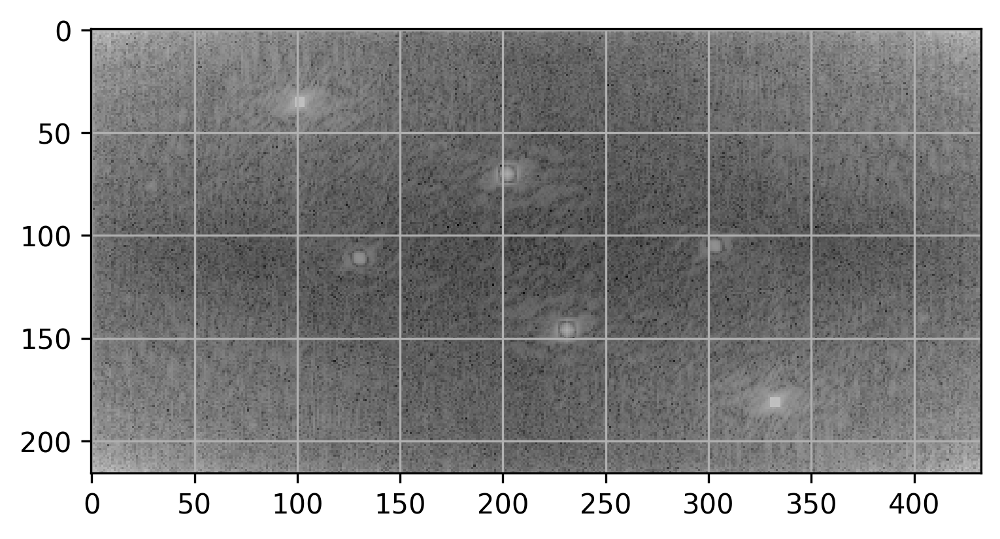

In [46]:
#plot the 2D DFT of the license plate image
im_dft = fft2(im)
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.grid(visible = True)

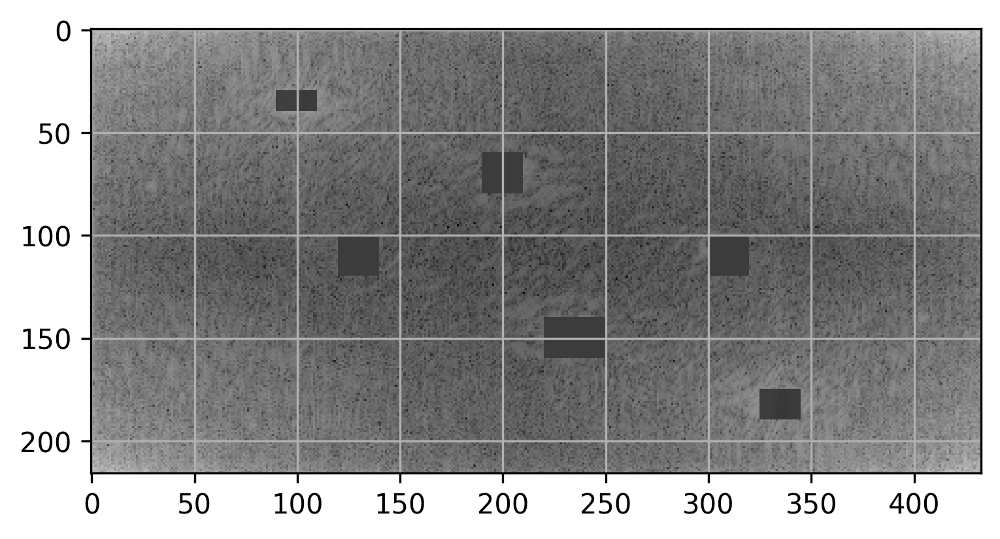

In [47]:
#image is 2D array: idea is that we want to go through all the bright spots and set them all to
#be the average of the whole thing. And you'll go through and do it for every bright spot
for i in range(90, 110):
    for j in range(30, 40):
        im_dft[j][i] = np.mean(im_dft)

for i in range(120, 140):
    for j in range(100, 120):
        im_dft[j][i] = np.mean(im_dft)

for i in range(190, 210):
    for j in range(60, 80):
        im_dft[j][i] = np.mean(im_dft)
        
for i in range(220, 250):
    for j in range(140, 160):
        im_dft[j][i] = np.mean(im_dft)
        
for i in range(300, 320):
    for j in range(100, 120):
        im_dft[j][i] = np.mean(im_dft)

for i in range(325, 345):
    for j in range(175, 190):
        im_dft[j][i] = np.mean(im_dft)

#plot the covered version
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.grid(visible = True)
plt.show()

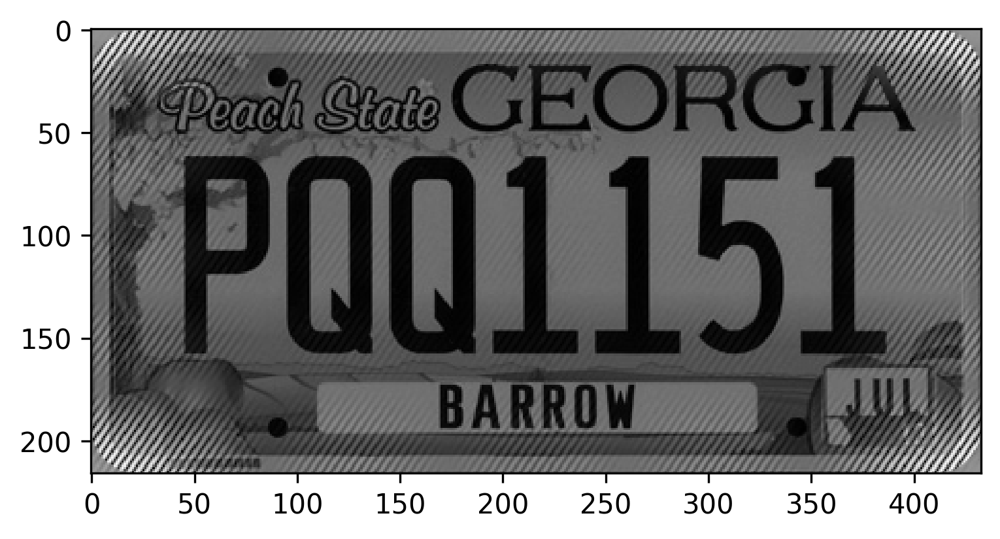

In [48]:
#plot the original license plate
plt.imshow(im, cmap = "gray")
plt.show()

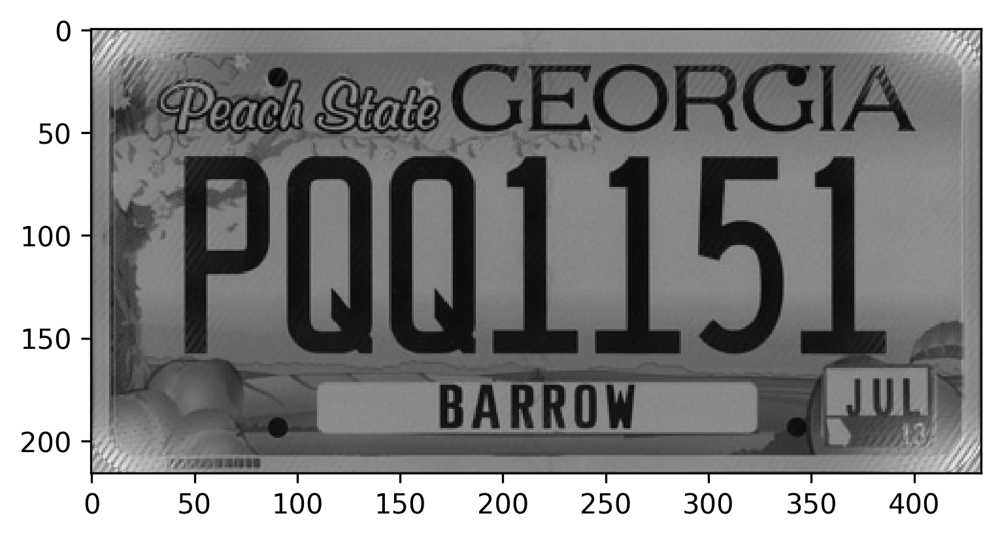

In [49]:
#now plot the improved license plate by taking the IDFT of the modified DFT
plt.imshow(ifft2(im_dft).real, cmap = "gray")
plt.show()


The year on the sticker is... 13          